In [ ]:
!nvidia-smi

Sat Apr 30 19:27:14 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P0    36W / 250W |    441MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from matplotlib import pyplot as plt
from glob import glob
from time import time
import tensorflow as tf
import pathlib
import os

In [ ]:
# !cp -r /content/drive/MyDrive/Dataset/image_super_resolution_v2 dataset

In [ ]:
# videos = glob('dataset/videos/*.mp4')

# if not pathlib.Path('dataset/images/train').exists():
#     os.mkdir('dataset/images/train')

# for video in videos:
#     filename = pathlib.Path(video).stem

#     print(f'Processing {filename}')
#     os.system(f'ffmpeg -y -i "{video}" -r 1 "dataset/images/train/{filename}_%4d.bmp"')

In [ ]:
def load_image(path, target_size=None):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    if target_size:
        img = tf.image.resize_with_pad(img, *target_size[:2], method='bicubic', antialias=True)
    return img

dataset = tf.data.Dataset.list_files('dataset/images/train/*.bmp').map(lambda x : load_image(x, (720, 1280)), num_parallel_calls=-1)
dataset_sample = next(dataset.batch(8).as_numpy_iterator())

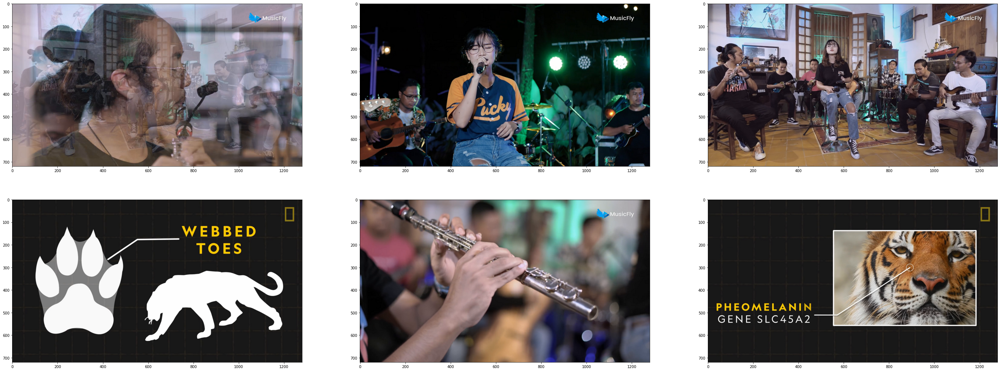

In [ ]:
def denormalize_output(x):
    x = tf.clip_by_value(x, 0, 255)
    x = tf.cast(x, tf.uint8)
    return x
    
def plot_image(image, ax=plt):
    image = denormalize_output(image)
    ax.imshow(image)
    ax.grid(False)

def plot_images(images, image_size=(16, 9), n_cols=3):
    n_row = int(tf.math.ceil(len(images) / n_cols))
    fig, ax = plt.subplots(n_row, n_cols, figsize=(image_size[0] * n_cols, image_size[1] * n_row))
    for i, image in enumerate(images):
        if n_row > 1:
            plot_image(image, ax[i // n_cols, i % n_cols])
        else:
            plot_image(image, ax[i % n_cols])
    plt.show()


plot_images(dataset_sample[:6])

In [ ]:
INPUT_SHAPE = (32, 32)
OUTPUT_SHAPE = (128, 128)
BATCH_SIZE = 64

In [ ]:
def get_patches(x):
    patches = []
    for i in range(32):
        _x = tf.image.random_crop(x, [*OUTPUT_SHAPE, 3])
        patches.append(_x)
    return tf.convert_to_tensor(patches)
    

def get_pair(y):
    x = tf.image.resize(y, INPUT_SHAPE, method='bicubic', antialias=True)
    return x, y


def quantize(x):
    x = tf.math.round(x)
    x = tf.clip_by_value(x, .0, 255.)
    return x

patches_dataset = dataset.map(get_patches).unbatch().shuffle(1024).map(lambda x : get_pair(x)).map(lambda x, y: (quantize(x), quantize(y)))
patches_dataset_sample = next(patches_dataset.batch(12).as_numpy_iterator())

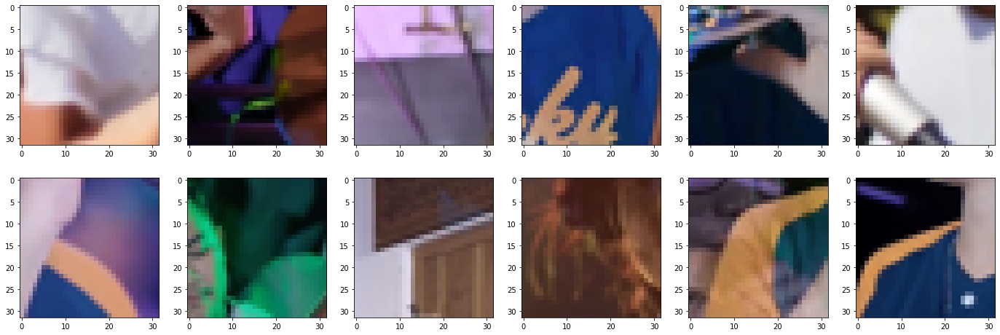

In [ ]:
plot_images(patches_dataset_sample[0], n_cols=6, image_size=(4, 4))

In [ ]:
plot_images(patches_dataset_sample[1], n_cols=6, image_size=(4, 4))

In [ ]:
def dataset_benchmark(dataset, epoch=8):
    for e in range(epoch):
        i = 0
        start = time()
        for x, _ in dataset:
            i += x.shape[0]
        print(f'Epoch {e + 1} - Total Time {int((time() - start) * 1000)} ms')
    return i

n_sample = dataset_benchmark(patches_dataset.batch(128), epoch=1)

In [ ]:
train_size = int(n_sample * .8)

train_ds = patches_dataset.take(train_size).cache().shuffle(train_size // 8, reshuffle_each_iteration=True).prefetch(tf.data.AUTOTUNE)
val_ds = patches_dataset.skip(train_size).cache().prefetch(tf.data.AUTOTUNE)

In [ ]:
dataset_benchmark(train_ds.batch(BATCH_SIZE));

In [ ]:
from numpy import dtype
def create_generator(n_filter=64):

    activation = tf.keras.layers.PReLU(shared_axes=[1, 2])
    kernel_initializer = tf.keras.initializers.GlorotUniform()

    def residual_block(x, n_filter):
        skip = x
        x = tf.keras.layers.Conv2D(n_filter, (3, 3), padding='same', use_bias=False, kernel_initializer=kernel_initializer)(x)
        x = tf.keras.layers.BatchNormalization(momentum=.8)(x)
        x = activation(x)

        x = tf.keras.layers.Conv2D(n_filter, (3, 3), padding='same', use_bias=False, kernel_initializer=kernel_initializer)(x)
        x = tf.keras.layers.BatchNormalization(momentum=.8)(x)

        x = tf.keras.layers.Add()([x, skip])
        return x

    x = _input = tf.keras.layers.Input(shape=(None, None, 3), name='input')
    x = tf.keras.layers.Rescaling(1 / 255.)(x)
    x = tf.keras.layers.Conv2D(n_filter, (7, 7), padding='same', kernel_initializer=kernel_initializer)(x)
    skip = x = activation(x)

    for _ in range(8):
        x = residual_block(x, n_filter)
        x = tf.keras.layers.Add()([skip, x])
    
    x = tf.keras.layers.Conv2D(n_filter, (3, 3), padding='same', use_bias=False, kernel_initializer=kernel_initializer)(x)
    x = tf.keras.layers.BatchNormalization(momentum=.8)(x)
    x = tf.keras.layers.Add()([x, skip])

    x = tf.keras.layers.Conv2D(n_filter * 16, (3, 3), padding='same', kernel_initializer=kernel_initializer)(x)
    x = tf.keras.layers.Lambda(lambda x: tf.nn.depth_to_space(x, 4))(x)
    x = activation(x)

    x = tf.keras.layers.Conv2D(3, (7, 7), padding='same', activation='tanh', kernel_initializer=kernel_initializer)(x)
    x = tf.keras.layers.Lambda(lambda x : ((x + 1) * 127.5), dtype=tf.uint8)(x)

    return tf.keras.models.Model(_input, x, name='Generator')

In [ ]:
MODEL_SAVE_PATH = 'drive/MyDrive/machine_learning/image_super_resolution-32x32'
pathlib.Path(MODEL_SAVE_PATH).mkdir(exist_ok=True)

In [ ]:
generator = create_generator()

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=n_sample // (BATCH_SIZE * 4),
    decay_rate=.96
)
generator.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), loss='mse', metrics='mae')

early_stoping = tf.keras.callbacks.EarlyStopping(patience=4, restore_best_weights=True)
generator.fit(train_ds.batch(BATCH_SIZE), validation_data=val_ds.batch(BATCH_SIZE), epochs=32, callbacks=[early_stoping])
generator.save(f'{MODEL_SAVE_PATH}/generator_mse.tf')

In [ ]:
generator.load_weights(f'{MODEL_SAVE_PATH}/generator_mse.tf')

In [ ]:
samples = [load_image(path) for path in sorted(glob('dataset/images/test/*.png'))]
generator_outputs = [generator(sample[None, :, :, :]) for sample in samples]
generator_outputs = [denormalize_output(generator_output)[0] for generator_output in generator_outputs]

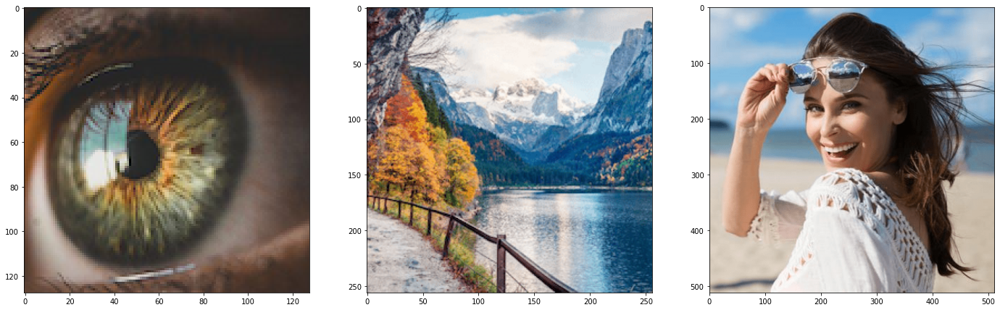

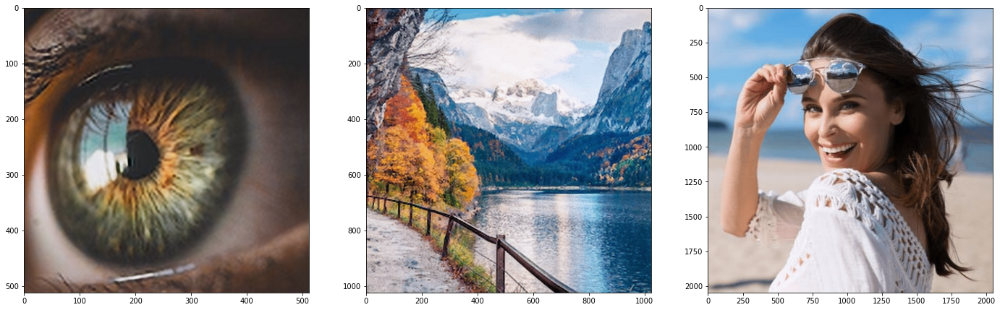

In [ ]:
plot_images(samples, image_size=(8, 8))
plot_images(generator_outputs, image_size=(8, 8))

In [ ]:
anchore_lr = load_image('/content/dataset/images/val/sample_0_lr.png')
anchore_hr = load_image('/content/dataset/images/val/sample_0_hr.png')
generated_hr = generator(tf.expand_dims(anchore_lr, axis=0))[0]
bilinear_hr = tf.image.resize(anchore_lr, anchore_hr.shape[:2])

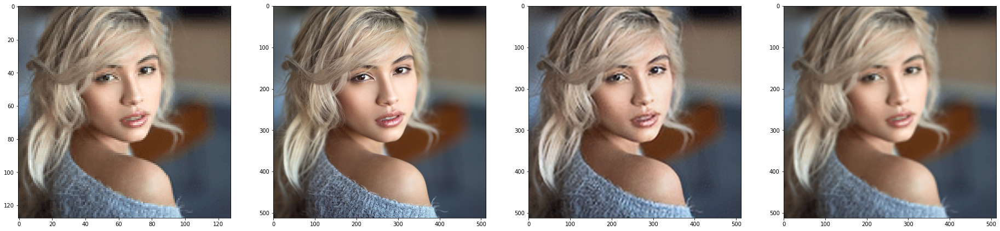

In [ ]:
plot_images([anchore_lr, anchore_hr, generated_hr, bilinear_hr], image_size=(8, 8), n_cols=4)

In [ ]:
 def split_model(model, input_name, output_name):
    _model = tf.keras.models.Model(model.get_layer(input_name).input, model.get_layer(output_name).output)
    _model.trainable = False
    return _model

In [ ]:
vgg = tf.keras.applications.VGG19(include_top=False, input_shape=(None, None, 3))
vgg = split_model(vgg, 'block1_conv1', 'block3_pool')

_input = tf.keras.layers.Input(shape=(None, None, 3))
x = tf.keras.layers.Rescaling(1 / 127.5, -1)(_input)
x = vgg(x)
vgg = tf.keras.models.Model(_input, x)
vgg.trainable = False

@tf.function
def ssim_loss(y, _y):
    y, _y = tf.cast(y, tf.float32), tf.cast(_y, tf.float32)
    y, _y = vgg(y), vgg(_y)
    return tf.keras.losses.mean_squared_error(y, _y)

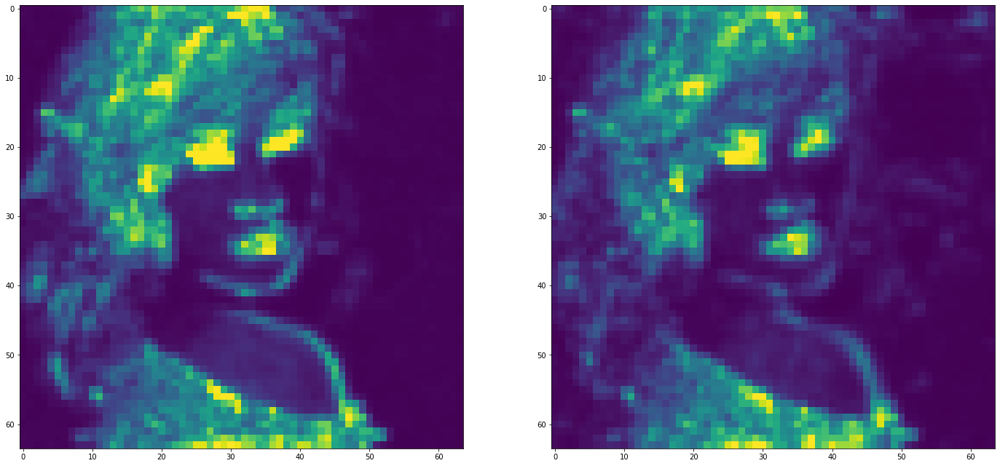

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12 * 2, 12))
plot_image(ssim_loss(anchore_hr[None, :, :, :],  bilinear_hr[None, :, :, :])[0], ax=ax[0])
plot_image(ssim_loss(anchore_hr[None, :, :, :], generated_hr[None, :, :, :])[0], ax=ax[1])

In [ ]:
@tf.function
def composite_loss(y, _y):
    ssim = ssim_loss(y, _y)
    mse = tf.keras.losses.mean_squared_error(y, _y)
    return mse + (tf.reduce_sum(ssim) * 1e-4)

In [ ]:
generator.load_weights(f'{MODEL_SAVE_PATH}/generator_mse.tf')

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=2e-4,
    decay_steps=n_sample // (BATCH_SIZE * 4),
    decay_rate=.96
)
generator.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), loss=composite_loss, metrics=['mse', 'mae'])

early_stoping = tf.keras.callbacks.EarlyStopping(patience=4, restore_best_weights=True)
generator.fit(train_ds.batch(BATCH_SIZE), validation_data=val_ds.batch(BATCH_SIZE), epochs=32, callbacks=[early_stoping])

In [ ]:
generator.loss = None
generator.optimizer = None
generator.save(f'{MODEL_SAVE_PATH}/generator_perceptual.tf')

In [ ]:
samples = [load_image(path) for path in sorted(glob('dataset/images/test/*.png'))]
generator_outputs = [generator(sample[None, :, :, :]) for sample in samples]
generator_outputs = [denormalize_output(generator_output)[0] for generator_output in generator_outputs]

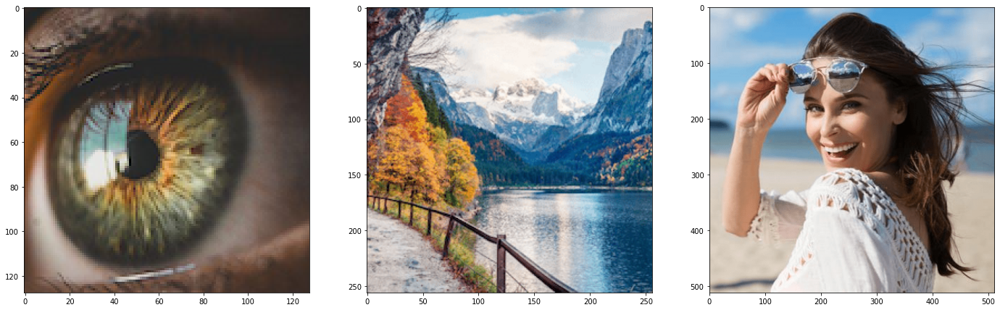

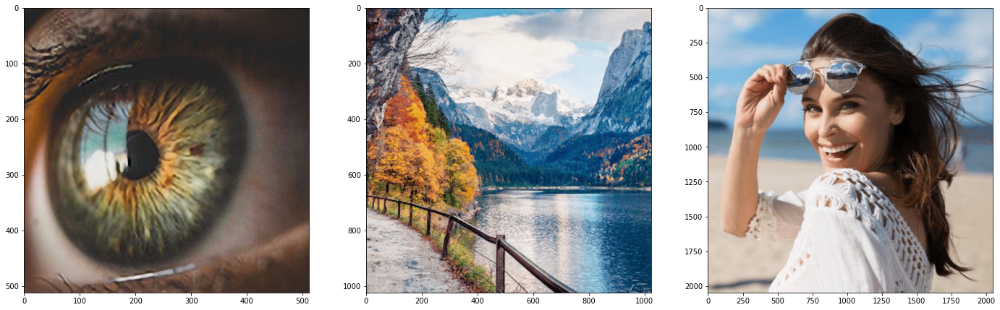

In [ ]:
plot_images(samples, image_size=(8, 8))
plot_images(generator_outputs, image_size=(8, 8))

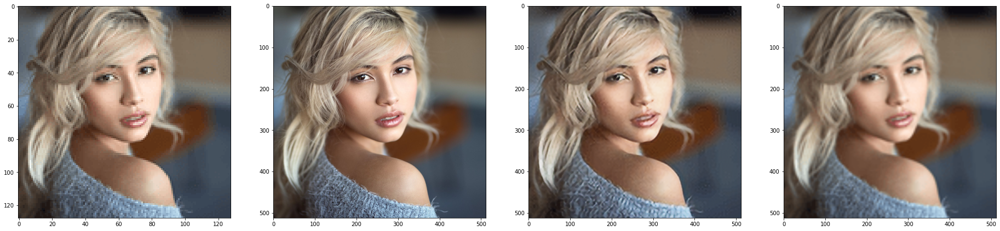

In [ ]:
generated_hr = generator(tf.expand_dims(anchore_lr, axis=0))[0]
plot_images([anchore_lr, anchore_hr, generated_hr, bilinear_hr], image_size=(8, 8), n_cols=4)

In [ ]:
lr_imgs = []
hr_imgs = []


for element in train_ds.take(1024 * 4).batch(64).as_numpy_iterator(): 
    _x, _y = element
    lr_imgs.extend(_x)
    hr_imgs.extend(_y)


lr_imgs = tf.cast(tf.convert_to_tensor(lr_imgs), dtype=tf.uint8)
hr_imgs = tf.cast(tf.convert_to_tensor(hr_imgs), dtype=tf.uint8)
fake_imgs = tf.cast(generator.predict(lr_imgs, batch_size=32), dtype=tf.uint8)

n_disc_dataset = len(lr_imgs)

In [ ]:
plot_images(lr_imgs[:6], n_cols=6, image_size=(4, 4))
plot_images(hr_imgs[:6], n_cols=6, image_size=(4, 4))
plot_images(fake_imgs[:6], n_cols=6, image_size=(4, 4))
plot_images(tf.image.resize(lr_imgs[:6], anchore_hr.shape[:2]), n_cols=6, image_size=(4, 4))

In [ ]:
disc_dataset = tf.data.Dataset.from_tensor_slices((hr_imgs, tf.ones(len(hr_imgs))))
fake_ds = tf.data.Dataset.from_tensor_slices((fake_imgs, tf.zeros(len(fake_imgs))))

disc_dataset = disc_dataset.concatenate(fake_ds).shuffle(n_disc_dataset * 2)

disc_train_ds = disc_dataset.take(int(n_disc_dataset * .8)).cache()
disc_val_ds = disc_dataset.skip(int(n_disc_dataset * .8)).cache()

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def get_discriminator():
    N_UNITS = 64
    KERNEL_SIZE = (4, 4)


    def down_block(x, num_filters, strides=1, batchnorm=True, momentum=0.8):
        x = tf.keras.layers.Conv2D(num_filters, kernel_size=KERNEL_SIZE, strides=strides, padding='same')(x)
        if batchnorm:
            x = tf.keras.layers.BatchNormalization(momentum=momentum)(x)
        return tf.keras.layers.LeakyReLU(alpha=0.2)(x)

    _input = tf.keras.layers.Input(shape=(*OUTPUT_SHAPE, 3))
    x = tf.keras.layers.Rescaling(127.5, -1)(_input)

    x = down_block(x, N_UNITS, batchnorm=False)
    x = down_block(x, N_UNITS, strides=(2, 2))

    x = down_block(x, N_UNITS * 2)
    x = down_block(x, N_UNITS * 2, strides=(2, 2))

    x = down_block(x, N_UNITS * 4)
    x = down_block(x, N_UNITS * 4, strides=(2, 2))

    x = down_block(x, N_UNITS * 8)
    x = down_block(x, N_UNITS * 8, strides=(2, 2))

    x = down_block(x, N_UNITS * 8)
    x = down_block(x, N_UNITS * 8, strides=(2, 2))

    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(1024)(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    x = tf.keras.layers.Dense(1)(x)

    return tf.keras.models.Model(_input, x)

In [ ]:
discriminator = get_discriminator()

discriminator.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss=cross_entropy, metrics=['acc'])

early_stoping = tf.keras.callbacks.EarlyStopping(patience=4, restore_best_weights=True)
discriminator.fit(disc_train_ds.batch(BATCH_SIZE), validation_data=disc_val_ds.batch(BATCH_SIZE), epochs=32, callbacks=[early_stoping])

discriminator.save(f'{MODEL_SAVE_PATH}/discriminator.tf')

In [ ]:
@tf.function
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

@tf.function
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
@tf.function
def train_step(x, y):
    x, y = tf.cast(x, dtype=tf.float32), tf.cast(y, dtype=tf.float32)

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(x, training=True)

        real_output = discriminator(y, training=True)
        fake_output = discriminator(generated_images, training=True)

        _mse = tf.keras.losses.mean_squared_error(y, generated_images)
        _perceptual = tf.reduce_mean(ssim_loss(y, generated_images)) * 1e-4
        _gen = generator_loss(fake_output) 

        gen_loss = _mse + _perceptual +_gen
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


    history = {}
    history['gen_loss'] = tf.reduce_mean(gen_loss)
    history['gen_pnsr'] = tf.reduce_mean(tf.image.psnr(y, generated_images, 255.))
    history['gen_mse'] = tf.reduce_mean(_mse)
    history['gen_mae'] = tf.reduce_mean(tf.keras.losses.mean_absolute_error(y, generated_images))
    history['gen_perceptual'] = tf.reduce_mean(_perceptual)
    history['gen_disc'] = tf.reduce_mean(_gen)
    history['disc_loss'] = tf.reduce_mean(disc_loss)
    return history

generator.load_weights(f'{MODEL_SAVE_PATH}/generator_perceptual.tf')
discriminator.load_weights(f'{MODEL_SAVE_PATH}/discriminator.tf')

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

for epoch in range(8):
    print ('\nEpoch : {}'.format(epoch + 1))

    for i, image_batch in enumerate(train_ds.batch(BATCH_SIZE)):
        history = train_step(*image_batch)
        print(f"\r\t{i + 1:3d} - Generator Loss : {history['gen_loss']:.4f} - MSE : {history['gen_mse']:.4f}  - MAE : {history['gen_mae']:.4f} - Disc : {history['gen_disc']:.4f} - Perceptual : {history['gen_perceptual']:.4f}, PNSR : {history['gen_pnsr']:.3f}, Discriminator Loss : {history['disc_loss']:.4f}", end="")
    
    generator.evaluate(val_ds.batch(BATCH_SIZE))

In [ ]:
generator.loss = None
generator.optimizer = None
generator.save(f'{MODEL_SAVE_PATH}/generator_gan.tf')

In [ ]:
generator.load_weights(f'{MODEL_SAVE_PATH}/generator_gan.tf')

In [ ]:
plot_images(patches_dataset_sample[0][:6], n_cols=6, image_size=(4, 4))
plot_images(generator(patches_dataset_sample[0][:6]), n_cols=6, image_size=(4, 4))
plot_images(patches_dataset_sample[1][:6], n_cols=6, image_size=(4, 4))

In [ ]:
samples = [load_image(path) for path in sorted(glob('dataset/images/test/*.png'))]
generator_outputs = [generator(sample[None, :, :, :]) for sample in samples]
generator_outputs = [denormalize_output(generator_output)[0] for generator_output in generator_outputs]

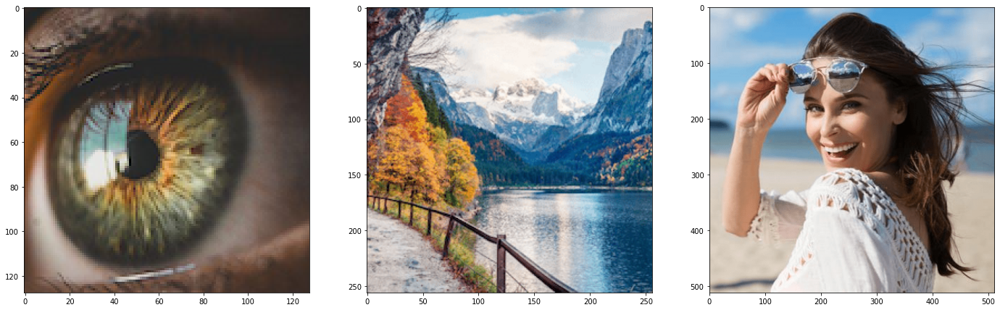

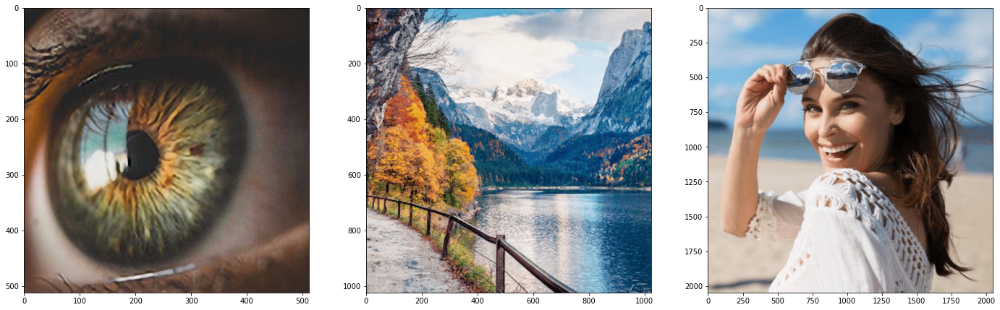

In [ ]:
plot_images(samples, image_size=(8, 8))
plot_images(generator_outputs, image_size=(8, 8))

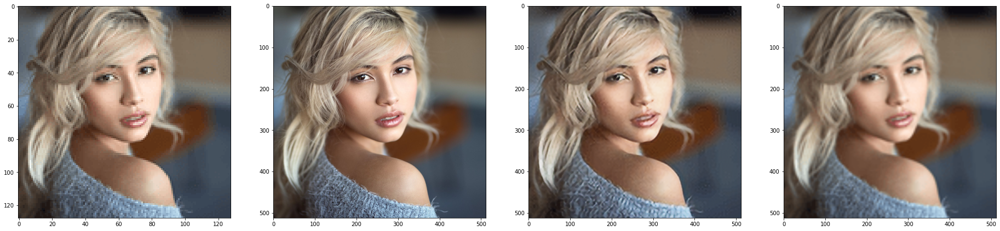

In [ ]:
generated_hr = generator(tf.expand_dims(anchore_lr, axis=0))[0]
plot_images([anchore_lr, anchore_hr, generated_hr, bilinear_hr], image_size=(8, 8), n_cols=4)

In [ ]:
from google.colab import files
from PIL import Image
from io import BytesIO
import numpy as np

uploaded = files.upload()
img_key = list(uploaded.keys())[0]

input_img = Image.open(BytesIO(uploaded[img_key]))
input_img = np.asarray(input_img)[None, :, :, :3]

plt.figure(figsize=(12, 12))
plt.imshow(input_img[0])

In [ ]:
img = np.asarray(generator(input_img)[0], dtype=np.uint8)

fig, ax = plt.subplots(1, 2, figsize=(16 * 2, 16))
ax[0].imshow(input_img[0])
ax[1].imshow(img)

ax[0].set_title('Input Image');
ax[1].set_title('Generated Image 2x')